In [1]:
import sys, os
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from cartopy import config
import cartopy.crs as ccrs
import cartopy as ctp

In [2]:
fname_mon_sst = "/home/jakob/climate_data/local/era5/era5_sst_2018-2019_mon_mean.nc"
ds = xr.open_dataset(fname_mon_sst)
da = ds['analysed_sst']

In [3]:
# Select a time interval
t_start = ds['time'].min() # 2019-01
t_end = ds['time'].max()
ds_interval = ds.sel(time=slice(t_start, t_end))

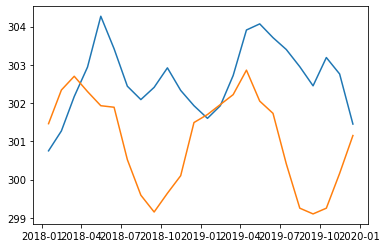

In [4]:
# Get certain points
lat_points = xr.DataArray([10, -10], dims="points")
lon_points = xr.DataArray([100, 100], dims="points")
locations = da.sel(lat=lat_points, lon=lon_points, method='nearest')
plt.plot(locations.time, locations[:,0])
plt.plot(locations.time, locations[:,1])

month_length = dc.time.dt.days_in_month
month_length

In [5]:
# Cut certain area
da_area = da.sel(lon=slice(-180, -70), lat=slice(-5, 5))
# da_area[0,:,:].plot()

In [ ]:
# Get area using where 
lat_range = [-90, -85]
lon_range = [-180, -175]
mask = (
         (da['lat'] >= min(lat_range) )
         & (da['lat'] <= max(lat_range) )
         & (da['lon'] >= min(lon_range) )
         & (da['lon'] <= max(lon_range) )
         )
da_region = da.where(mask, -99)
da_region

In [139]:
# Compute anomalies
#climatology = da.groupby("time.month").mean("time")
#anomalies = da.groupby("time.month") - climatology
# store to file
dirname = "/home/jakob/climate_data/local/era5/"
fname = dirname +"era5_sst_2018-2019_mon_anomalies.nc"
#anomalies.to_netcdf(fname)
# Or read from file
ds_anomaly = xr.open_dataset(fname)
anomalies = ds_anomaly['analysed_sst']
# anomalies.sel(lon=slice(100, 150), lat=slice(-5, 5))[0,:,:].plot()

AttributeError: 'Frozen' object has no attribute 'shape'

In [12]:
# Coursen the resolution
anomalies_course = anomalies.coarsen(lon=10).mean().coarsen(lat=10).mean()

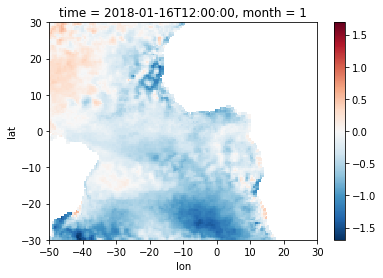

In [23]:
anomalies_course.sel(lon=slice(-50, 30), lat=slice(-30, 30))[0,:,:].plot()

In [66]:
# Roll ds such that it is centered around the pacific the antimeridian
ds_rolled = ds_anomaly.roll(lon=(ds_anomaly.dims['lon'] // 2))
# Change coordinates as well
lons = ds_rolled.lon
ds_rolled = ds_rolled.assign_coords(lon=np.where(lons < 0, (lons % 180),(lons % 180 - 180)))

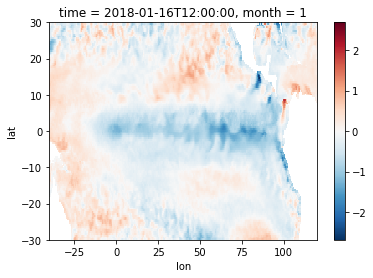

In [68]:
anomalies_course = ds_rolled['analysed_sst'].coarsen(lon=10).mean().coarsen(lat=10).mean()
anomalies_course.sel(lon=slice(-40, 120), lat=slice(-30, 30))[0,:,:].plot()

## Weighted mean and variance of a selected area

In [116]:
ano_area = anomalies_course.sel(lon=slice(-40, 120), lat=slice(-30, 30))
weights = np.cos(np.deg2rad(ano_area.lat))
# weighted mean
ano_weights = ano_area.weighted(weights)
weighted_mean = ano_weights.mean(('lon', 'lat'))

In [124]:
# weighted variance
buff = (ano_area - weighted_mean)**2
var_weights = buff.weighted(weights)
weighted_var = var_weights.mean(('lon', 'lat'))

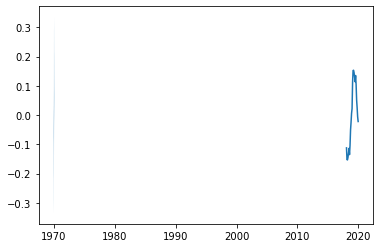

In [128]:
plt.plot(weighted_mean.time, weighted_mean.data)
plt.fill_between(, weighted_mean.data- weighted_var.data, weighted_mean.data + weighted_var.data)

In [ ]:
# Weighted mean

lat_ax = np.argwhere(np.array(anomalies_course.dims) == 'lat')[0,0]
masked_number = np.sum(~np.isnan(ano_area.data), axis=lat_ax)
weights = np.cos(np.deg2rad(anomalies_course.lat))
*masked_number
#weights